## Data Input

In [1]:
# Import required packages
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt
import pylab as pl
import adjustText as aT
import matplotlib as mtp

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed

import contextily as cx
from shapely.geometry import Polygon
from shapely.geometry import Point
import plotly.express as px
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import plot_moran
from splot.esda import moran_scatterplot
from splot.esda import plot_local_autocorrelation
from splot.esda import lisa_cluster
from esda.moran import Moran_Local

# Loading a few new packages
from scipy import stats
from pysal.model import spreg
import statsmodels.formula.api as sm

/opt/anaconda3/envs/NCG613_Project/lib/python3.8/site-packages/pysal/model/spvcm/abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


In [2]:
# Uploading datasets
hp = gpd.read_file('hp.geojson') 
lb = gpd.read_file('london_boroughs.geojson')
oa = gpd.read_file('OutputAreas.geojson')
sch = gpd.read_file('London_Schools.geojson')

In [3]:
# Changing CRS to British National Grid
hp.crs = {'init': 'epsg:27700'}
lb.crs = {'init': 'epsg:27700'}
oa.crs = {'init': 'epsg:27700'}
sch.crs = {'init': 'epsg:27700'}

In [4]:
# Renaming borough name column in output areas file
oa = oa.rename(columns = {'NAME_2': 'NAME'}, inplace = False)

In [5]:
# Using numpy, creating three new binary columns based on whether the houses are detached, flats, or freehold
hp['Detached'] = np.where(hp['propertytype']=='D', 1, 0)
hp['Flats'] = np.where(hp['propertytype']=='F', 1, 0)
hp['Freehold'] = np.where(hp['duration']=='F', 1, 0)

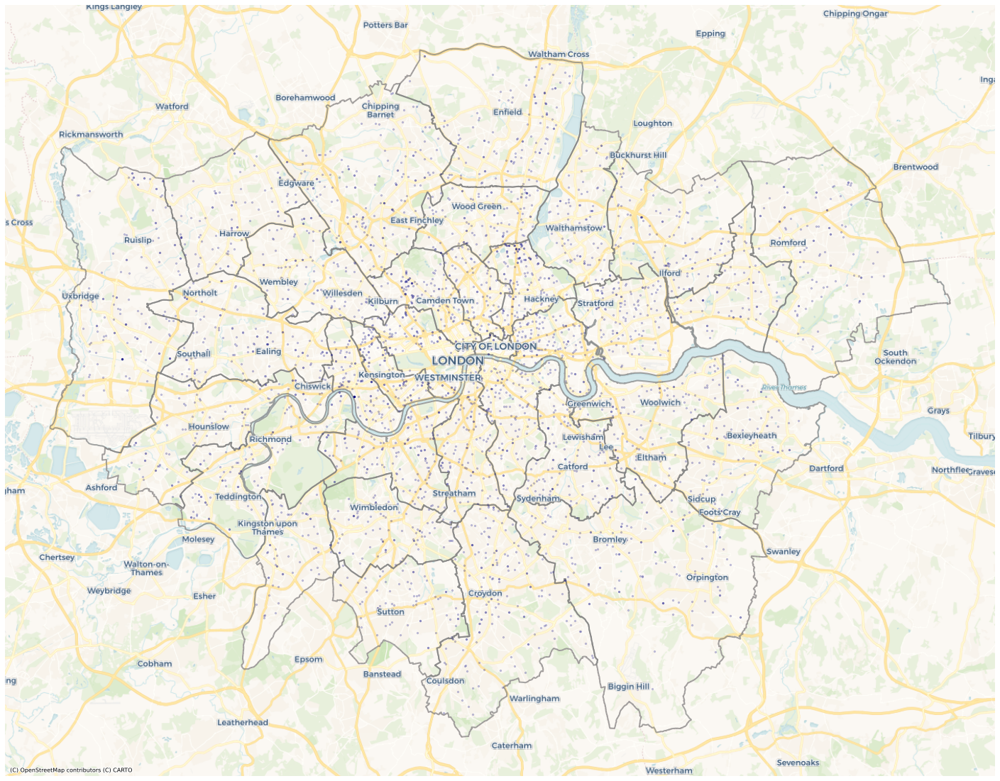

In [6]:
# Plot of all schools in the Greater London area
f, ax = plt.subplots(1, figsize=(25, 20)) 

lb.to_crs('EPSG:3857').plot(ax=ax, alpha=0.7, color='None', linewidth=2, edgecolor='grey')
sch.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color='navy', markersize=5)
ax.set_axis_off()
#ax.set_title('Total Number of Schools') 
plt.axis('equal') 

cx.add_basemap(ax, source=cx.providers.CartoDB.VoyagerNoLabels, alpha=1)
cx.add_basemap(ax, source=cx.providers.CartoDB.VoyagerOnlyLabels)

#texts = []
#for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
#    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
#    
#aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
#               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

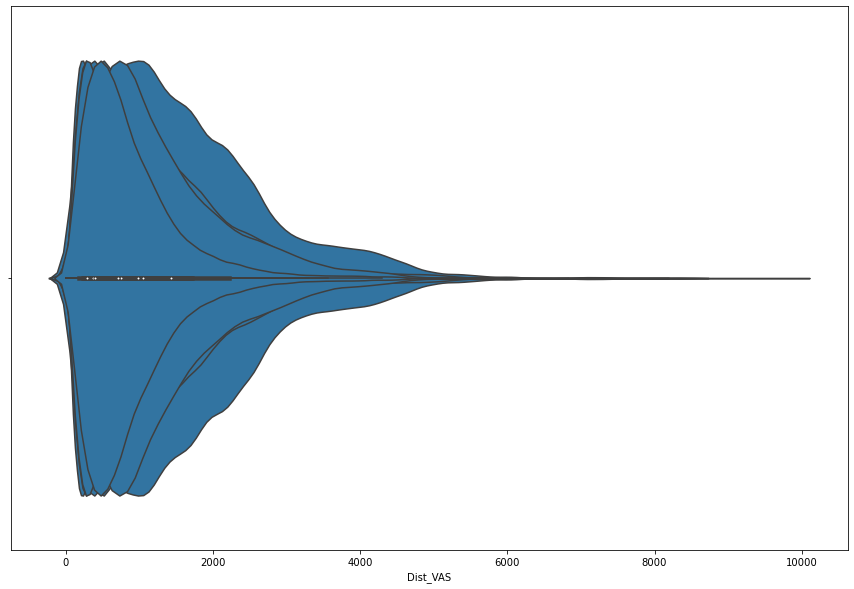

In [7]:
# Overlying violin plots of the distances to each type of school - clearly skewed right so log distance preferable
bx = seaborn.violinplot(x=hp["Dist_School"])
bx = seaborn.violinplot(x=hp["Dist_AcSponsor"])
bx = seaborn.violinplot(x=hp["Dist_FSM"])
bx = seaborn.violinplot(x=hp["Dist_Of1"])
bx = seaborn.violinplot(x=hp["Dist_Of12"])
bx = seaborn.violinplot(x=hp["Dist_Prim12"])
bx = seaborn.violinplot(x=hp["Dist_Sec12"])
bx = seaborn.violinplot(x=hp["Dist_VAS"])

## Non-spatial Ordinary Least Squares (OLS) regression

In [8]:
# Joining house price data to output area data using Geopandas - saved in new dataset hp2
hp2 = gpd.sjoin(hp,oa)
pd.set_option('display.max_columns', None)
hp2.head()

,ID,east,north,price,propertytype,duration,fl_area,No_Rooms,Price_Per_sqm,Postcode,logprice,log_fl_area,Dist_School,Dist_AcConv,Dist_FSM,Dist_Priv,Dist_Of1,Dist_Of12,Dist_Prim12,Dist_Sec12,Dist_VAS,Dist_AcSponsor,geometry,Detached,Flats,Freehold,index_right,geo_code,label,NAME,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens
0,1,528925,157964,995000,D,F,288.0,7,3454.861111,CR5 3EZ,5.997823,2.459392,943.612208,1852.404114,1852.404114,943.612208,1972.702968,1303.989264,1303.989264,2733.169772,1303.989264,2733.169772,POINT (528925.000 157964.000),1,0,1,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.375940,197,0.062914,0.127451,21.0,0.348490
16174,16175,529109,157935,720000,D,F,141.4,7,5091.937765,CR5 3EH,5.857332,2.150449,784.413794,1705.065981,1705.065981,784.413794,1795.243716,1291.652043,1291.652043,2547.375905,1291.652043,2547.375905,POINT (529109.000 157935.000),1,0,1,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.375940,197,0.062914,0.127451,21.0,0.348490
17146,17147,529166,157845,535000,T,F,143.0,6,3741.258741,CR5 3EQ,5.728354,2.155336,681.558508,1705.221686,1705.221686,681.558508,1756.834938,1373.847881,1373.847881,2472.446764,1373.847881,2472.446764,POINT (529166.000 157845.000),0,0,1,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.375940,197,0.062914,0.127451,21.0,0.348490
1,2,533634,180992,1300000,F,L,140.0,3,9285.714286,EC3N 1NT,6.113943,2.146128,249.353163,1398.845953,543.945769,479.688441,249.353163,249.353163,249.353163,1133.884033,249.353163,2112.389405,POINT (533634.000 180992.000),0,1,0,12112,E00000029,E92000001E41000324E00000029,City of London,225.0,14.696280,127.0,15.31,0.740157,125,0.095000,0.136364,110.0,7.184847
29,30,533634,180992,680000,F,L,84.0,3,8095.238095,EC3N 1NT,5.832509,1.924279,249.353163,1398.845953,543.945769,479.688441,249.353163,249.353163,249.353163,1133.884033,249.353163,2112.389405,POINT (533634.000 180992.000),0,1,0,12112,E00000029,E92000001E41000324E00000029,City of London,225.0,14.696280,127.0,15.31,0.740157,125,0.095000,0.136364,110.0,7.184847


In [9]:
# Setting variable names from columns of interest - including deprivation factor DEPRHH
variable_names = ['log_fl_area', 'No_Rooms', 'Flats', 'Detached', 'DEPRHH']

In [10]:
# Calculating log versions of all distances
hp2['Log_Dist_School'] = np.log(hp2['Dist_School']+1)
hp2['Log_Dist_AcSponsor'] = np.log(hp2['Dist_AcSponsor']+1)
hp2['Log_Dist_FSM'] = np.log(hp2['Dist_FSM']+1)
hp2['Log_Dist_Priv'] = np.log(hp2['Dist_Priv']+1)
hp2['Log_Dist_Of1'] = np.log(hp2['Dist_Of1']+1)
hp2['Log_Dist_Of12'] = np.log(hp2['Dist_Of12']+1)
hp2['Log_Dist_Prim12'] = np.log(hp2['Dist_Prim12']+1)
hp2['Log_Dist_Sec12'] = np.log(hp2['Dist_Sec12']+1)
hp2['Log_Dist_VAS'] = np.log(hp2['Dist_VAS']+1)

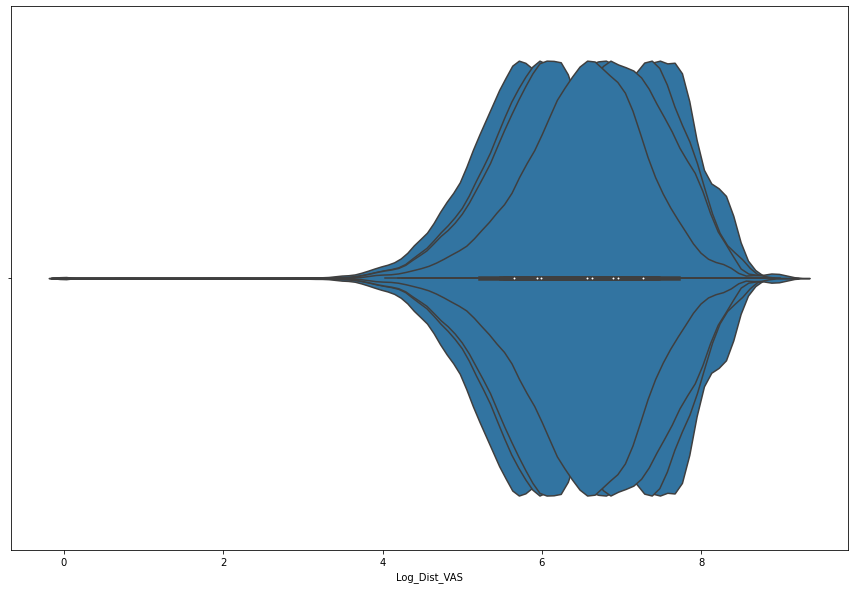

In [11]:
# Plots of log distance show a more normal distribution
bx = seaborn.violinplot(x=hp2["Log_Dist_School"])
bx = seaborn.violinplot(x=hp2["Log_Dist_AcSponsor"])
bx = seaborn.violinplot(x=hp2["Log_Dist_FSM"])
bx = seaborn.violinplot(x=hp2["Log_Dist_Of1"])
bx = seaborn.violinplot(x=hp2["Log_Dist_Of12"])
bx = seaborn.violinplot(x=hp2["Log_Dist_Prim12"])
bx = seaborn.violinplot(x=hp2["Log_Dist_Sec12"])
bx = seaborn.violinplot(x=hp2["Log_Dist_VAS"])

In [12]:
# Initial ordinary least squares regression using housing factors controlled by deprivation factor using spreg
m1 = spreg.OLS(hp2[['logprice']].values, hp2[variable_names].values,
                name_y='logprice', name_x=variable_names, robust='white')
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           6
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70919
R-squared           :      0.5826
Adjusted R-squared  :      0.5826
Sum squared residual:    1839.678                F-statistic           :  19801.2975
Sigma-square        :       0.026                Prob(F-statistic)     :           0
S.E. of regression  :       0.161                Log likelihood        :   28871.984
Sigma-square ML     :       0.026                Akaike info criterion :  -57731.969
S.E of regression ML:      0.1611                Schwarz criterion     :  -57676.953

White Standard Errors
-------------------------------------------------------

In [13]:
# New column created in hp2 with the residuals from the first OLS regression
hp2['residual'] = m1.u
medians = hp2.groupby("NAME").residual.median().to_frame('hood_residual')

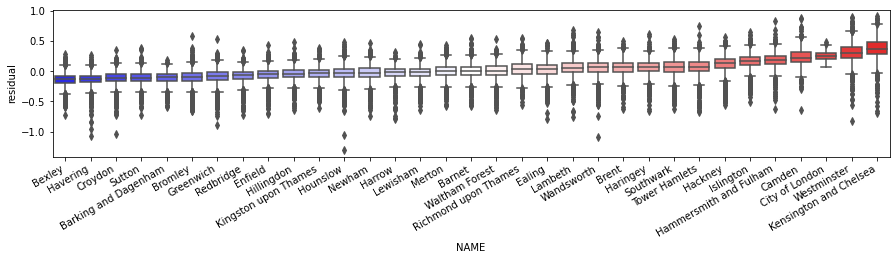

In [14]:
# Plotting the distribution of residuals by borough
f = plt.figure(figsize=(15,3))
ax = plt.gca()
seaborn.boxplot('NAME', 'residual', ax = ax,
                data=hp2.merge(medians, how='left',
                              left_on='NAME',
                              right_index=True)
                   .sort_values('hood_residual'), palette='bwr')
f.autofmt_xdate()
plt.show()

In [15]:
# Creating a distance-based spatial weights matrix and generating spatial lags of the residuals
w = weights.DistanceBand.from_dataframe(hp2, 500) # Weights based on features within 500 meters

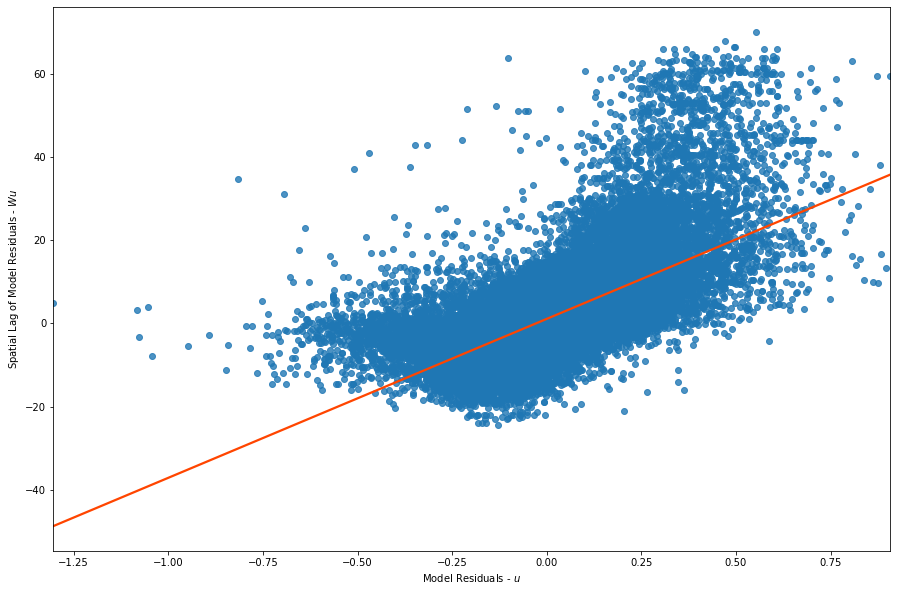

In [16]:
# Correlating these spatially-lagged residuals with the residuals of the model in their origin locations
lag_residual = weights.spatial_lag.lag_spatial(w, m1.u)
ax = seaborn.regplot(m1.u.flatten(), lag_residual.flatten(), 
                     line_kws=dict(color='orangered'),
                     ci=None)
ax.set_xlabel('Model Residuals - $u$')
ax.set_ylabel('Spatial Lag of Model Residuals - $W u$');

('WARNING: ', 5, ' is an island (no neighbors)')
('WARNING: ', 46, ' is an island (no neighbors)')
('WARNING: ', 2601, ' is an island (no neighbors)')
('WARNING: ', 2954, ' is an island (no neighbors)')
('WARNING: ', 6074, ' is an island (no neighbors)')
('WARNING: ', 9698, ' is an island (no neighbors)')
('WARNING: ', 9315, ' is an island (no neighbors)')
('WARNING: ', 9215, ' is an island (no neighbors)')
('WARNING: ', 9268, ' is an island (no neighbors)')
('WARNING: ', 10173, ' is an island (no neighbors)')
('WARNING: ', 10681, ' is an island (no neighbors)')
('WARNING: ', 13295, ' is an island (no neighbors)')
('WARNING: ', 11140, ' is an island (no neighbors)')
('WARNING: ', 12876, ' is an island (no neighbors)')
('WARNING: ', 10407, ' is an island (no neighbors)')
('WARNING: ', 11532, ' is an island (no neighbors)')
('WARNING: ', 13068, ' is an island (no neighbors)')
('WARNING: ', 12099, ' is an island (no neighbors)')
('WARNING: ', 15584, ' is an island (no neighbors)')
('WARNI

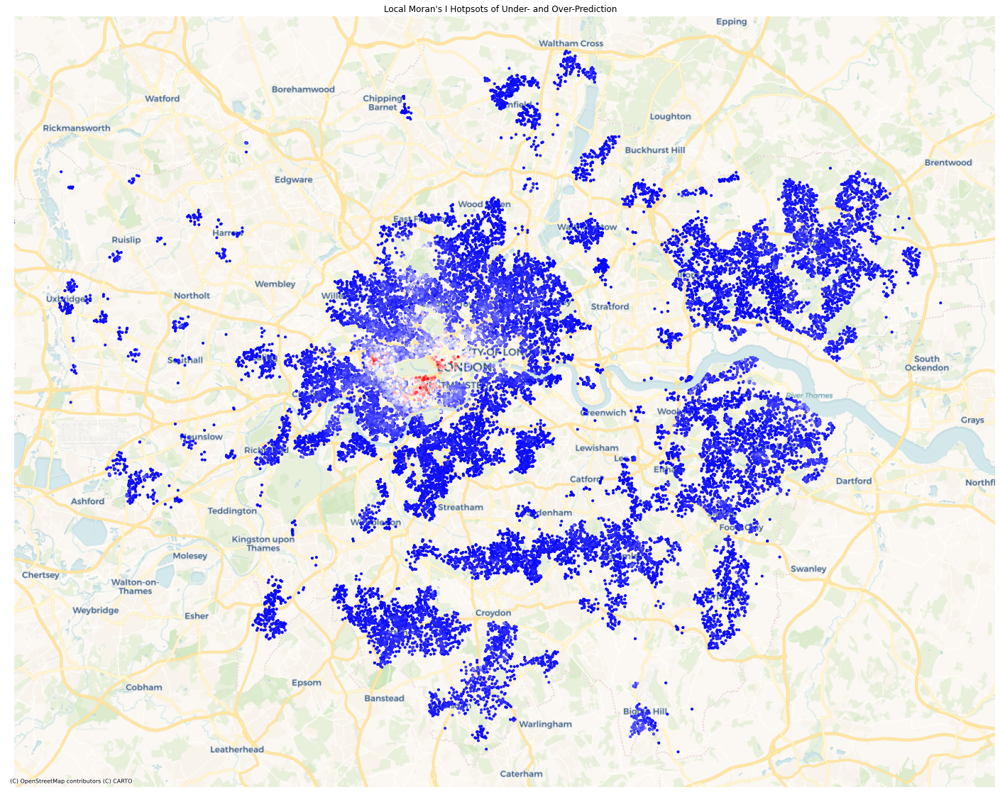

In [17]:
# Plot a local Moran's I map of local outliers of prediction error
# Here, red points correspond to "high-high" spatial clusters of positive residuals, 
# while blue points correspond to "low-low" spatial clusters of negative residuals

outliers = esda.moran.Moran_Local(m1.u, w, permutations=999)
error_clusters = (outliers.q % 2 == 1) # only the cluster cores
error_clusters &= (outliers.p_sim <= .001) # filtering out non-significant clusters
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp2.assign(error_clusters = error_clusters,
          local_I = outliers.Is)\
  .query("error_clusters")\
  .sort_values('local_I')\
  .to_crs('EPSG:3857').plot('local_I', cmap='bwr', marker='.', ax=ax)
ax.set_title("Local Moran's I Hotpsots of Under- and Over-Prediction")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

## Spatial Heterogeneity and Fixed Effects

In [18]:
# Controlling for the heterogenous relationships between the predictor variables and housing price by neighborhood 
# Insert dummy variables for each borough directly in the regression model as 'fixed effects'
# These fixed effects then control for all of the unobserved variation (outside of the other covariates) associated
# with each borough, and can be a very useful way to observe heterogeneity in relationships across space. 

f = 'logprice ~ ' + ' + '.join(variable_names) + ' + NAME - 1' # Remove intercept (-1) in this fixed effects model
print(f)

logprice ~ log_fl_area + No_Rooms + Flats + Detached + DEPRHH + NAME - 1


In [19]:
# Fixed effect summary with OLS
m2 = sm.ols(f, data=hp2).fit()
print(m2.summary2())

                       Results: Ordinary least squares
Model:                 OLS                 Adj. R-squared:        0.811       
Dependent Variable:    logprice            AIC:                   -113014.7546
Date:                  2021-05-15 16:56    BIC:                   -112666.6341
No. Observations:      70338               Log-Likelihood:        56545.      
Df Model:              37                  F-statistic:           8133.       
Df Residuals:          70300               Prob (F-statistic):    0.00        
R-squared:             0.811               Scale:                 0.011735    
------------------------------------------------------------------------------
                              Coef.  Std.Err.     t     P>|t|   [0.025  0.975]
------------------------------------------------------------------------------
NAME[Barking and Dagenham]    4.4922   0.0082  549.5767 0.0000  4.4761  4.5082
NAME[Barnet]                  4.6460   0.0079  585.8263 0.0000  4.6304  4.66

In [20]:
# Extract neighbourhood effects from the model
neighborhood_effects = m2.params.filter(like='NAME')
neighborhood_effects.head()

NAME[Barking and Dagenham]    4.492150
NAME[Barnet]                  4.645962
NAME[Bexley]                  4.470518
NAME[Brent]                   4.703163
NAME[Bromley]                 4.525907
dtype: float64

In [21]:
# Strip off the coefficient naming convention from the table, and put them into a dataframe
stripped = neighborhood_effects.index.str.strip('NAME[').str.strip(']')
neighborhood_effects.index = stripped
neighborhood_effects = neighborhood_effects.to_frame('fixed_effect')
neighborhood_effects.head()

,fixed_effect
Barking and Dagenham,4.492150
Barnet,4.645962
Bexley,4.470518
Brent,4.703163
Bromley,4.525907


1

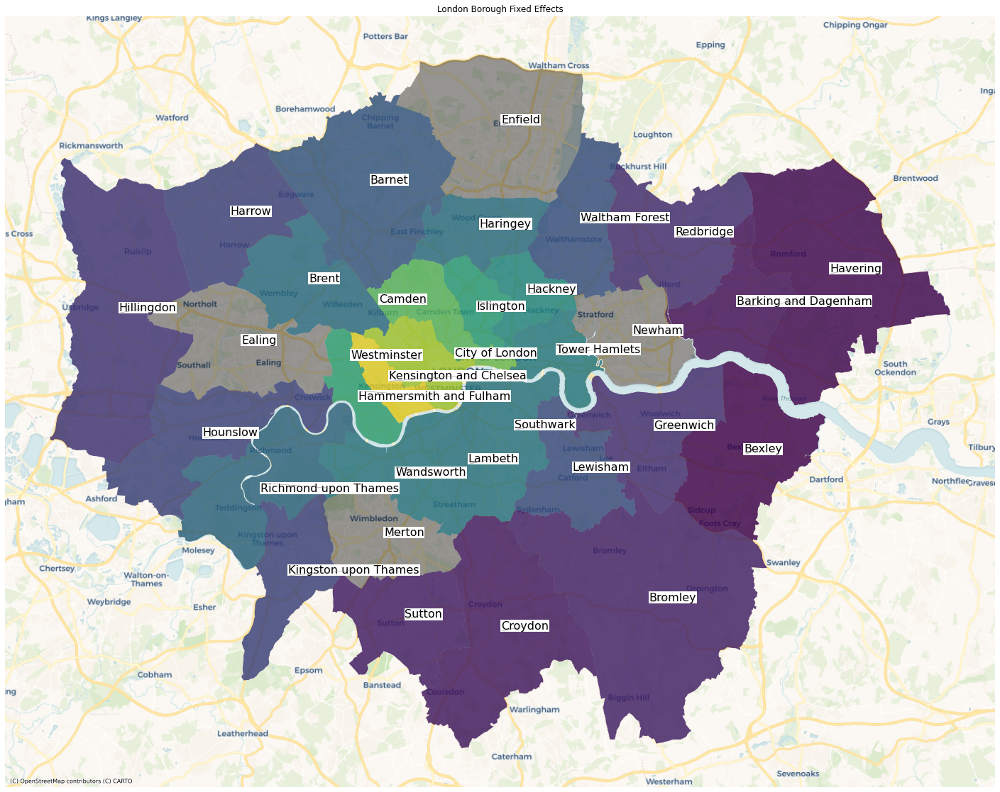

In [22]:
# Create a new "NAME" column that can be used to join back to the 
# boroughs GeoJSON file in order to map the fixed effects

neighborhood_effects['NAME'] = neighborhood_effects.index

f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
lb.to_crs('EPSG:3857').plot(ax=ax, color='k', alpha=0.4)
lb.merge(neighborhood_effects, how='left',
                    left_on='NAME', 
                    right_on='NAME')\
                  .dropna(subset=['fixed_effect'])\
                  .to_crs('EPSG:3857').plot('fixed_effect',
                        ax=ax, alpha=.7)

ax.set_title("London Borough Fixed Effects")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

lb["center"] = lb["geometry"].centroid.to_crs('EPSG:3857')
lb_points = lb.copy()
lb_points.set_geometry("center", inplace = True)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

In [23]:
# Can add in additional parameters into dist_names, but as this is the base case test, only the housing parameters
# controlled by the deprivation factor are used
base_names = variable_names
dist_names = variable_names

In [24]:
# OLS regression
m3 = spreg.OLS(hp2[['logprice']].values, hp2[dist_names].values,
                name_y='logprice', name_x=dist_names, robust='white')
print(m3.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           6
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70919
R-squared           :      0.5826
Adjusted R-squared  :      0.5826
Sum squared residual:    1839.678                F-statistic           :  19801.2975
Sigma-square        :       0.026                Prob(F-statistic)     :           0
S.E. of regression  :       0.161                Log likelihood        :   28871.984
Sigma-square ML     :       0.026                Akaike info criterion :  -57731.969
S.E of regression ML:      0.1611                Schwarz criterion     :  -57676.953

White Standard Errors
-------------------------------------------------------

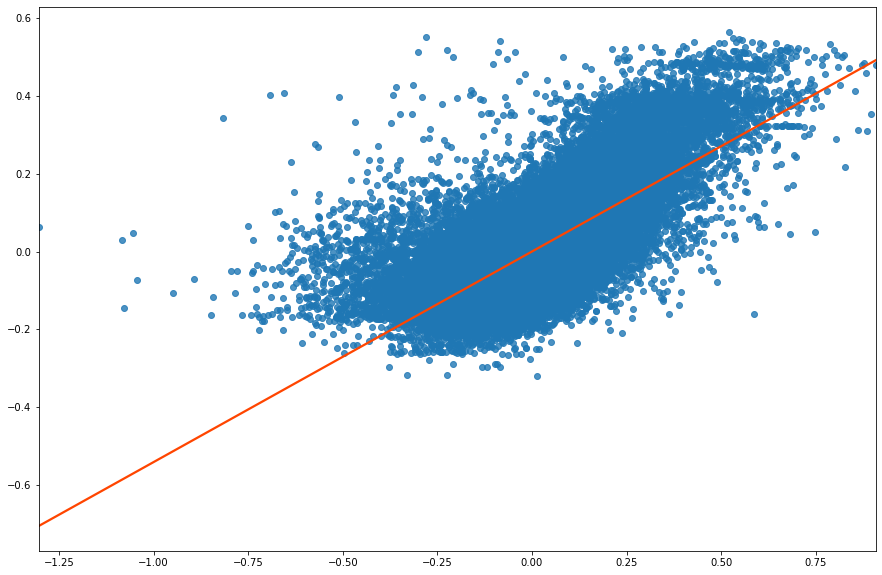

In [25]:
# Checking the spatial clustering of the model residuals
lag_residual = weights.spatial_lag.lag_spatial(w, m3.u)
seaborn.regplot(m3.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

## Spatial Diagnostics

In [26]:
# If we provide the model with the spatial weights matrix (w), the residual Moran's I can be calculated,
# as well as the robust Lagrange Multipliers for the spatial lag, spatial error, and spatial lag + error models

m4 = spreg.OLS(hp2[['logprice']].values, hp2[dist_names].values,
                name_y='logprice', name_x=dist_names, robust='white', w=w, spat_diag=True, moran=True)
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           6
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70919
R-squared           :      0.5826
Adjusted R-squared  :      0.5826
Sum squared residual:    1839.678                F-statistic           :  19801.2975
Sigma-square        :       0.026                Prob(F-statistic)     :           0
S.E. of regression  :       0.161                Log likelihood        :   28871.984
Sigma-square ML     :       0.026                Akaike info criterion :  -57731.969
S.E of regression ML:      0.1611                Schwarz criterion     :  -57676.953

White Standard Errors
-------------------------------------------------------

## Spatial Lag Model (SAR)

In [27]:
# The spatial lag model is used in cases where it is assumed that 
# there is spatial dependence or contagion in the dependent variable

m5 = spreg.GM_Lag(hp2[['logprice']].values, hp2[dist_names].values,
                     w=w, name_y='logprice', name_x=dist_names, robust='white')
print(m5.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           7
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70918
Pseudo R-squared    :      0.6915
Spatial Pseudo R-squared:  0.5507

White Standard Errors
------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       2.4456012       0.1550710      15.7708527       0.0000000
         log_fl_area       0.7814277       0.0109288      71.5015285       0.0000000
            No_Rooms       0.0066953 

## Spatial Error Model (SEM)

In [28]:
# The spatial error model is used in cases where it is assumed that there is residual spatial error in the 
# specification of the model

m6 = spreg.GM_Error_Het(hp2[['logprice']].values, hp2[dist_names].values,
                     w=w, name_y='logprice', name_x=dist_names)
print(m6.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           6
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70919
Pseudo R-squared    :      0.4987
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.6546863       0.0104535     445.2746919       0.0000000
         log_fl_area       0.6037478       0.0050481     119.6000712       0.00

## Spatial Lag + Error Model (SARMA)

In [29]:
# The spatial diagnostic tests indicated that both spatial lag and error processes may be occurring 
# in the model specification

m7 = spreg.GM_Combo_Het(hp2[['logprice']].values, hp2[dist_names].values,
                     w=w, name_y='logprice', name_x=dist_names)
print(m7.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED TWO STAGE LEAST SQUARES (HET)
-------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:       70925
Mean dependent var  :      5.6704                Number of Variables   :           7
S.D. dependent var  :      0.2493                Degrees of Freedom    :       70918
Pseudo R-squared    :      0.5612
Spatial Pseudo R-squared:  0.5006
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.0842241       0.0704791      57.9494368       0.0000000
         log_fl_area     

## Spatial Regimes Models

In [30]:
# To model spatial regimes, the data is subset by regime and has separate regressions run for each, 
# observing changing variable relationships, significances, etc., in order to better understand 
# how the important predictors of housing price vary by neighborhood

In [31]:
# Camden

hpcam = hp2[(hp2["NAME"]=="Camden")]
wcam = weights.DistanceBand.from_dataframe(hpcam, 500)
m7cam = spreg.GM_Error_Het(hpcam[['logprice']].values, hpcam[dist_names].values,
                     w=wcam, name_y='logprice', name_x=dist_names)
print(m7cam.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:        1315
Mean dependent var  :      5.9246                Number of Variables   :           6
S.D. dependent var  :      0.2912                Degrees of Freedom    :        1309
Pseudo R-squared    :      0.8250
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.5812522       0.0615955      74.3763897       0.0000000
         log_fl_area       0.7722633       0.0325515      23.7243385       0.00

In [32]:
# Barking and Dagenham

hpbd = hp2[(hp2["NAME"]=="Barking and Dagenham")]
wbd = weights.DistanceBand.from_dataframe(hpbd, 500)
m7bd = spreg.GM_Error_Het(hpbd[['logprice']].values, hpbd[dist_names].values,
                     w=wbd, name_y='logprice', name_x=dist_names)
print(m7bd.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:        1718
Mean dependent var  :      5.4417                Number of Variables   :           6
S.D. dependent var  :      0.1305                Degrees of Freedom    :        1712
Pseudo R-squared    :      0.6804
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.8287628       0.0500936      96.3948567       0.0000000
         log_fl_area       0.3573943       0.0284848      12.5468393       0.00

In [33]:
# Kensington and Chelsea

hpken = hp2[(hp2["NAME"]=="Kensington and Chelsea")]
wken = weights.DistanceBand.from_dataframe(hpken, 500)
m7ken = spreg.GM_Error_Het(hpken[['logprice']].values, hpken[dist_names].values,
                     w=wken, name_y='logprice', name_x=dist_names)
print(m7ken.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:        1182
Mean dependent var  :      6.1308                Number of Variables   :           6
S.D. dependent var  :      0.3638                Degrees of Freedom    :        1176
Pseudo R-squared    :      0.8183
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.3968898       0.0672475      65.3836803       0.0000000
         log_fl_area       0.9931808       0.0359340      27.6390614       0.00

In [34]:
# Hackey

hphack = hp2[(hp2["NAME"]=="Hackney")]
whack = weights.DistanceBand.from_dataframe(hphack, 500)
m7hack = spreg.GM_Error_Het(hphack[['logprice']].values, hphack[dist_names].values,
                     w=whack, name_y='logprice', name_x=dist_names)
print(m7hack.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    logprice                Number of Observations:        1390
Mean dependent var  :      5.7244                Number of Variables   :           6
S.D. dependent var  :      0.2220                Degrees of Freedom    :        1384
Pseudo R-squared    :      0.6686
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       4.8174442       0.0588450      81.8666880       0.0000000
         log_fl_area       0.6716985       0.0345858      19.4212018       0.00

# Maps

## Log House Price

In [35]:
hpX = hp2.groupby('NAME').agg({'price':['mean','median'], 'ID':'count'})
hpX.columns = ['Mean_Price','Median_Price', 'House_Count']
hpX = hpX.reset_index()

lb2 = lb.merge(hpX)
lb2['House_Dens'] = lb2['House_Count']/(lb2['HECTARES']*.01)

1

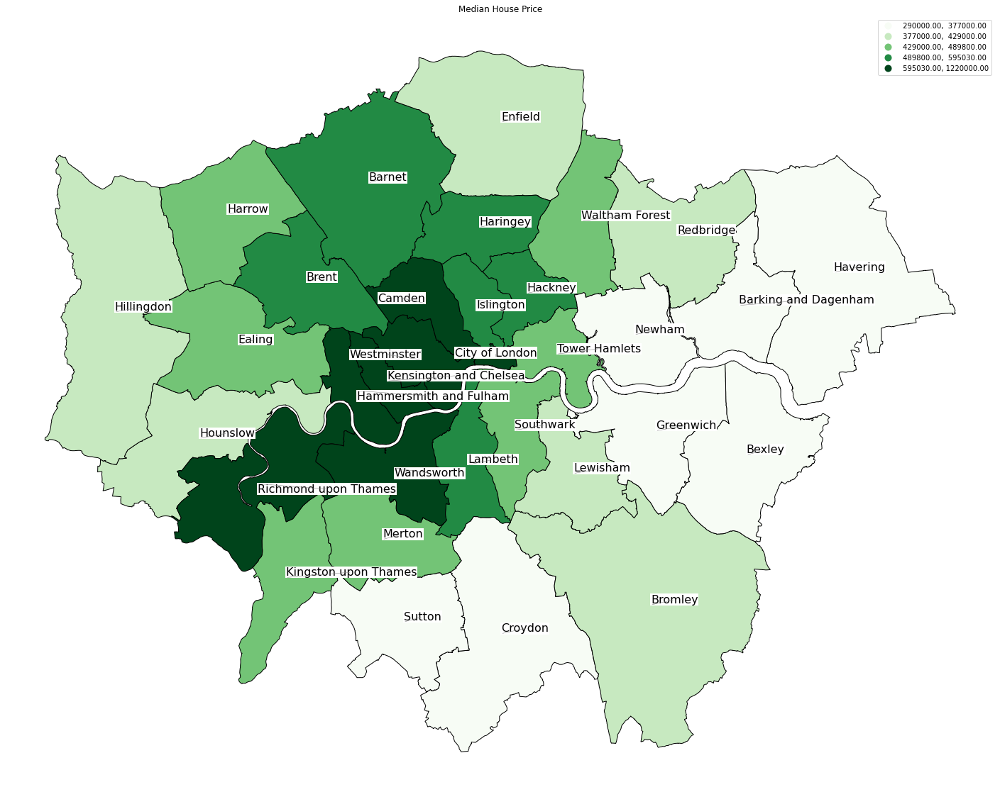

In [36]:
f, ax = plt.subplots(1, figsize=(25, 20)) 

lb2.to_crs('EPSG:3857').plot(ax=ax, column='Median_Price', alpha=1,legend=True, cmap='Greens', scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Median House Price') 
plt.axis('equal') 

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

In [37]:
# Calculating mean ofsted scores and FSM for publicly funded schools
sch_ofsted = sch[sch.Ofsted_Rating != 0]
sch_ofsted2 = gpd.sjoin(sch_ofsted,lb)
sch_ofsted3 = sch_ofsted2.groupby('NAME').agg({'URN':'count','Ofsted_Rating':['mean','median'],'PerFSM':['mean','median']})

sch_ofsted3.columns = ['School_Count','Mean_Ofsted','Median_Ofsted','Mean_FSM','Median_FSM']
sch_ofsted3 = sch_ofsted3.reset_index()

lb2 = lb.merge(sch_ofsted3)
lb2.crs = {'init': 'epsg:27700'}

### Plot 1 - Average Ofsted Score

1

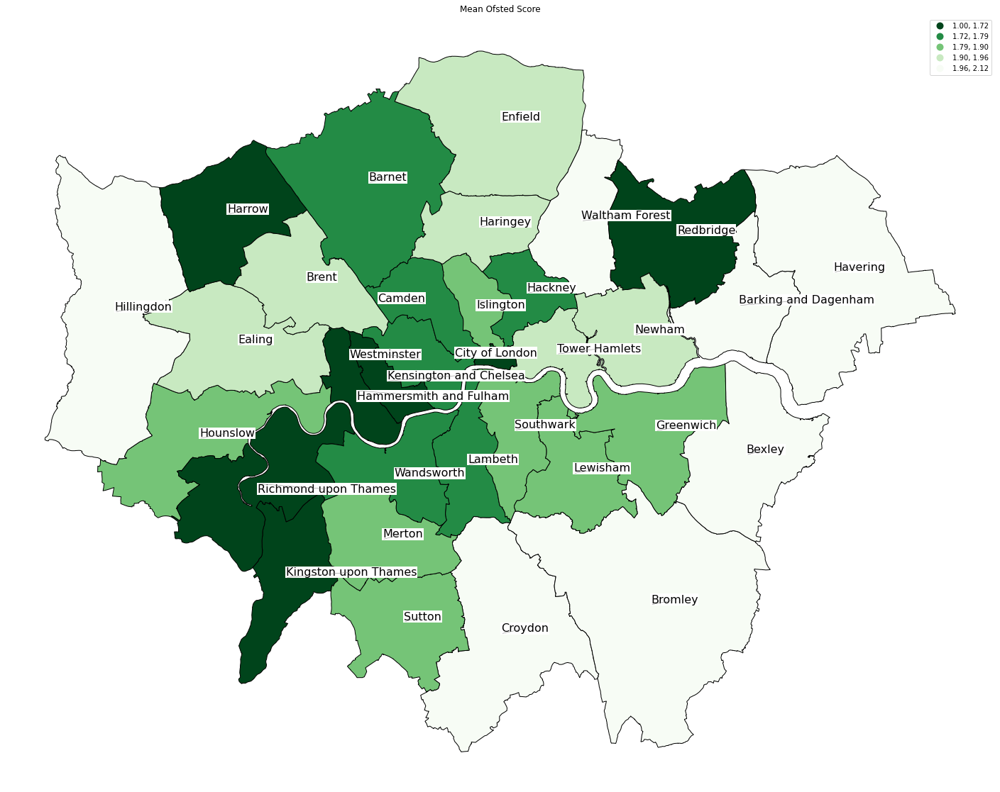

In [38]:
cmap_reversed = mtp.cm.get_cmap('Greens_r') # reverses colour ramp as the lower the number, the better for Ofsted ratings

f, ax = plt.subplots(1, figsize=(25, 20)) 

lb2.to_crs('EPSG:3857').plot(ax=ax, column='Mean_Ofsted', alpha=1,legend=True, cmap=cmap_reversed, scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Mean Ofsted Score') 
plt.axis('equal') 

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

### Plot 2 - Percentage of Outstanding Ofsted Schools per Borough

In [39]:
# Calculating percentage of schools with Ofsted 1 ratings
sch_of1 = sch[sch.Ofsted_Rating == 1]
sch_of1_2 = gpd.sjoin(sch_of1,lb)
sch_of1_3 = sch_of1_2.groupby('NAME').agg({'URN':'count'})

sch_of1_3.columns = ['School_Count']
sch_of1_3 = sch_of1_3.reset_index()

sch_of1_3['Percent_Of1_Sch'] = (sch_of1_3['School_Count']/sch_ofsted3['School_Count'])*100

lb_of1 = lb.merge(sch_of1_3)
lb_of1.crs = {'init': 'epsg:27700'}

1

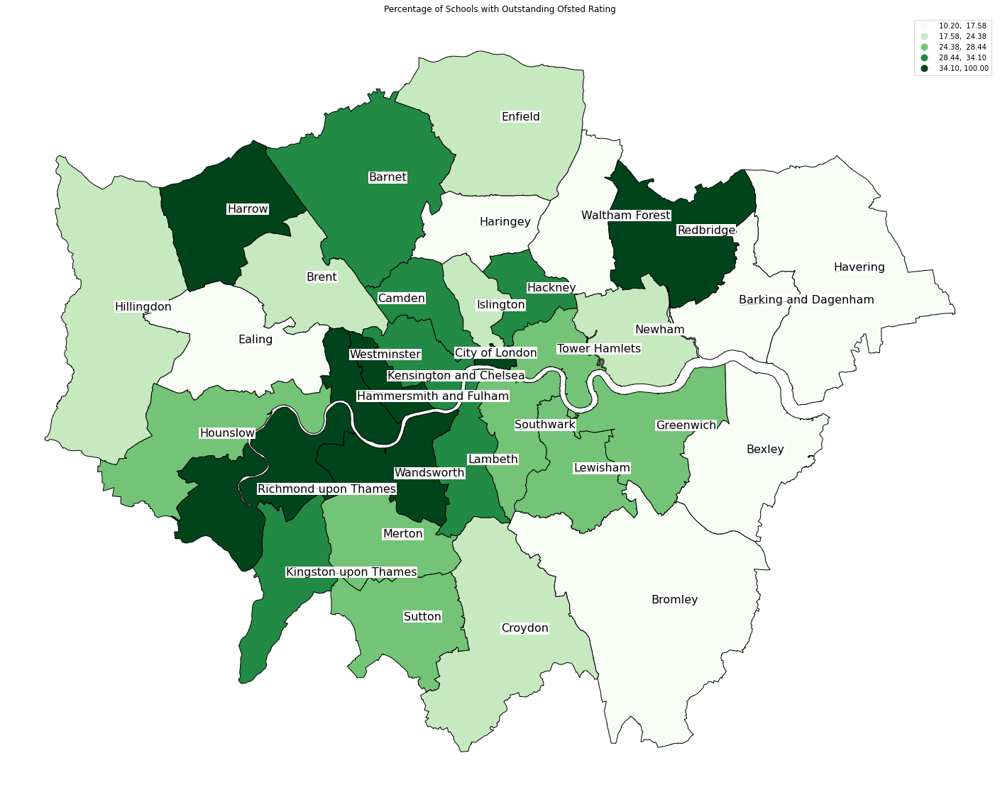

In [40]:
f, ax = plt.subplots(1, figsize=(25, 20)) 

lb_of1.to_crs('EPSG:3857').plot(ax=ax, column='Percent_Of1_Sch', alpha=1,legend=True, cmap='Greens', scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Percentage of Schools with Outstanding Ofsted Rating') 
plt.axis('equal')

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

### Plot 3 - Private Schools

In [41]:
# Calculating count of Private Schools
sch_priv = sch[sch.TYPE == 'Other Independent School']
sch_priv_2 = gpd.sjoin(sch_priv,lb)
sch_priv_3 = sch_priv_2.groupby('NAME').agg({'URN':'count'})

sch_priv_3.columns = ['Private_School_Count']
sch_priv_3 = sch_priv_3.reset_index()

lb_priv = lb.merge(sch_priv_3)
lb_priv.crs = {'init': 'epsg:27700'}

lb_priv['Priv_Sch_Dens'] = lb_priv['Private_School_Count']/(lb_priv['HECTARES']*.01)

(-61515.78409167359, 41878.99638039208, 6668564.976922218, 6748233.195725516)

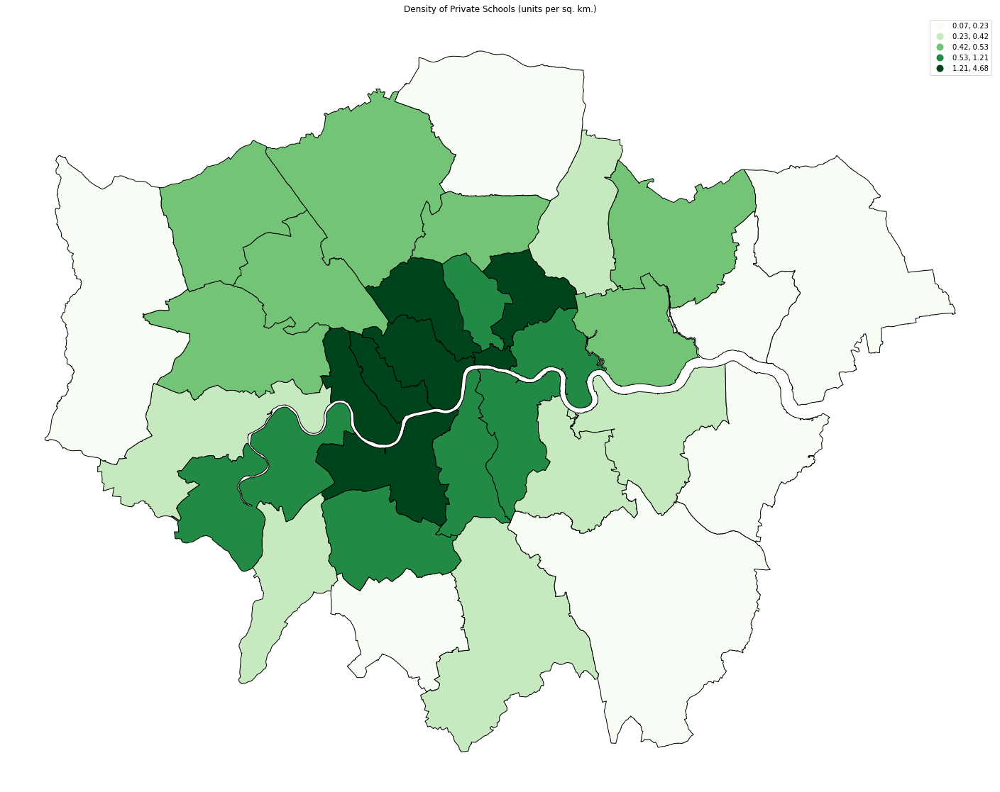

In [42]:
f, ax = plt.subplots(1, figsize=(25, 20)) 

lb_priv.to_crs('EPSG:3857').plot(ax=ax, column='Priv_Sch_Dens', alpha=1,legend=True, cmap='Greens', scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Density of Private Schools (units per sq. km.)') 
plt.axis('equal')

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

#texts = []
#for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
#    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
#aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
 #              arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

### Plot 4 - Voluntary Aided Schools 

In [43]:
# Calculating count of Voluntary Aided Schools
sch_VAS = sch[sch.TYPE == 'Voluntary Aided School']
sch_VAS_2 = gpd.sjoin(sch_VAS,lb)
sch_VAS_3 = sch_VAS_2.groupby('NAME').agg({'URN':'count'})

sch_VAS_3.columns = ['VAS_Count']
sch_VAS_3 = sch_VAS_3.reset_index()

lb_VAS = lb.merge(sch_VAS_3)
lb_VAS.crs = {'init': 'epsg:27700'}

lb_VAS['VAS_Sch_Dens'] = lb_VAS['VAS_Count']/(lb_VAS['HECTARES']*.01)

(-61515.78409167359, 41878.99638039208, 6668564.976922218, 6748233.195725516)

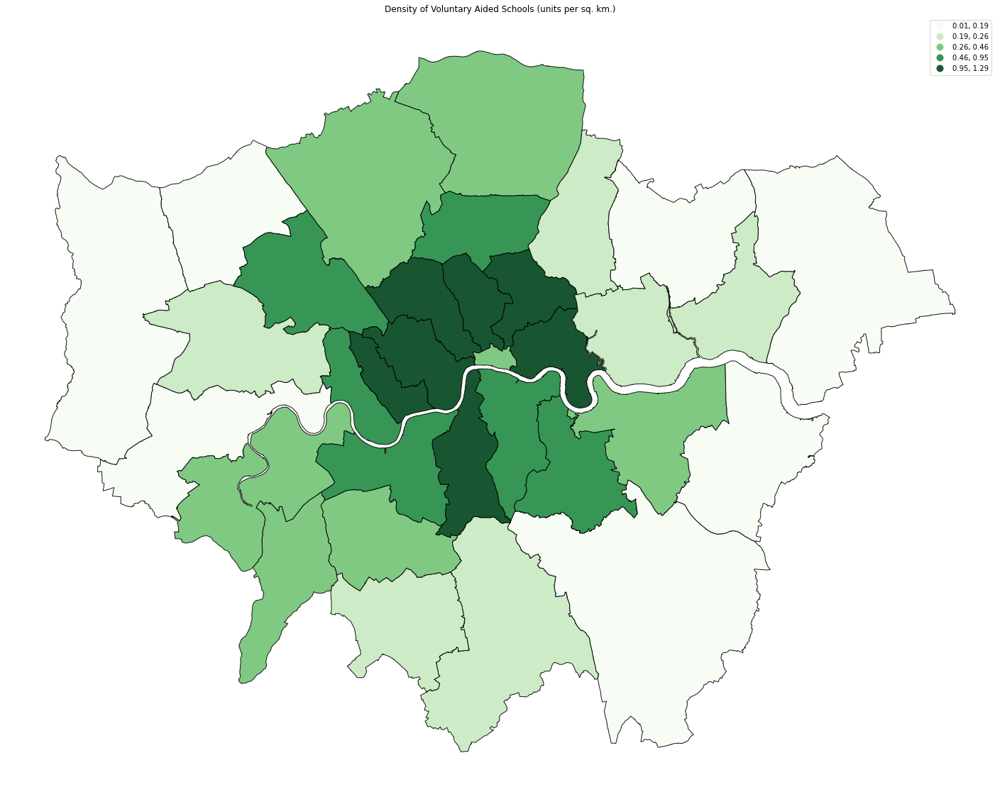

In [44]:
f, ax = plt.subplots(1, figsize=(25, 20)) 

lb_VAS.to_crs('EPSG:3857').plot(ax=ax, column='VAS_Sch_Dens', alpha=0.9,legend=True, cmap='Greens', scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Density of Voluntary Aided Schools (units per sq. km.)') 
plt.axis('equal')

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

#texts = []
#for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
#    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
#aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
#               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

### Plot 5 - Sponsored Academy Schools 

In [45]:
# Calculating count of Academy Sponsor Led Schools
sch_Ac = sch[sch.TYPE == 'Academy Sponsor Led']
sch_Ac_2 = gpd.sjoin(sch_Ac,lb)
sch_Ac_3 = sch_Ac_2.groupby('NAME').agg({'URN':'count'})

sch_Ac_3.columns = ['AcSpon_Count']
sch_Ac_3 = sch_Ac_3.reset_index()

sch_Ac = lb.merge(sch_Ac_3)
sch_Ac.crs = {'init': 'epsg:27700'}

sch_Ac['AcSpon_Sch_Dens'] = sch_Ac['AcSpon_Count']/(sch_Ac['HECTARES']*.01)

1

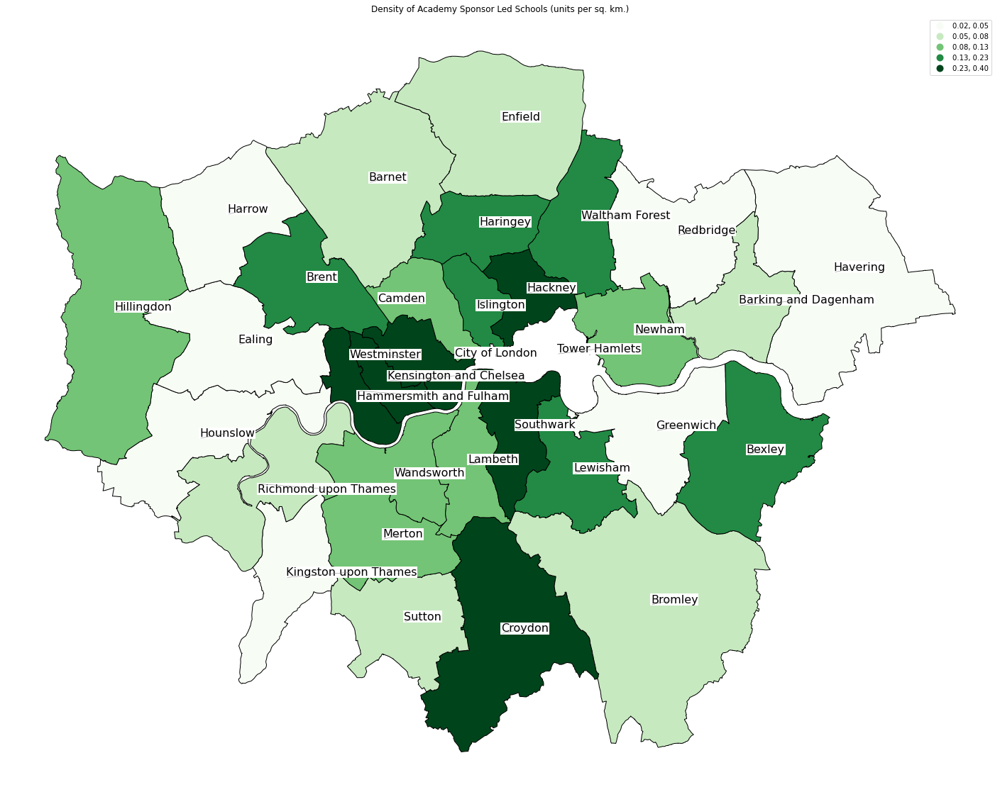

In [46]:
f, ax = plt.subplots(1, figsize=(25, 20)) 

sch_Ac.to_crs('EPSG:3857').plot(ax=ax, column='AcSpon_Sch_Dens', alpha=1,legend=True, cmap='Greens', scheme='Quantiles', k=5, edgecolor='black')
ax.set_axis_off()
ax.set_title('Density of Academy Sponsor Led Schools (units per sq. km.)') 
plt.axis('equal')

#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))

### Plot 6 - Free School Meals

1

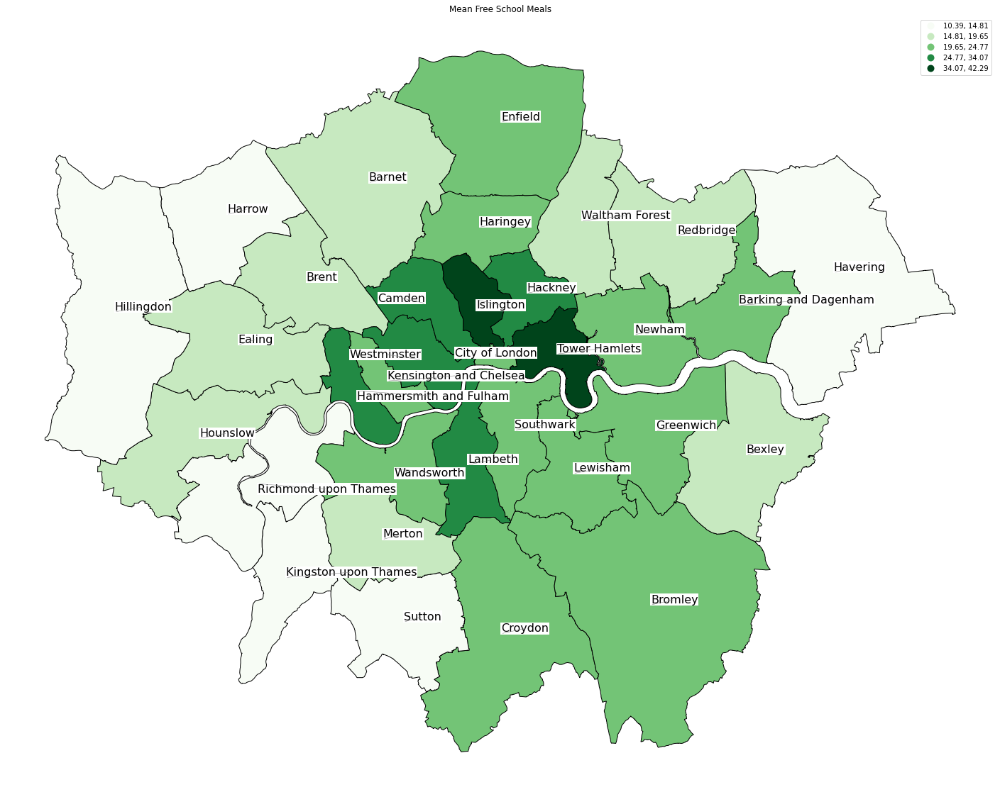

In [47]:
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure


lb2.to_crs('EPSG:3857').plot(ax=ax, column='Mean_FSM', legend=True, cmap='Greens', scheme='FisherJenks', k=5, edgecolor='black')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Mean Free School Meals') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
#cx.add_basemap(ax, source=cx.providers.CartoDB.Positron, alpha=0.6)

texts = []
for x, y, label in zip(lb_points.geometry.x, lb_points.geometry.y, lb_points["NAME"]):
    texts.append(pl.text(x, y, label, fontsize = 16, bbox=dict(boxstyle='square,pad=0.05', fc='white', ec='none')))
    
aT.adjust_text(texts, force_points=0.7, force_text=0.8, expand_points=(1,1), expand_text=(1,1), 
               arrowprops=dict(arrowstyle="-", color='grey', lw=0.5))